#  <font color='red'>OpenSource LLM:Question & Answering from Image</font>

```
    !pip install transformers
```

In [1]:
pip install --trusted-host pypi.org --trusted-host pypi.python.org --trusted-host files.pythonhosted.org pip setuptools


[notice] A new release of pip is available: 23.2.1 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


- Here is some code that suppresses warning messages.

In [2]:
from transformers.utils import logging
logging.set_verbosity_error()

import warnings
warnings.filterwarnings("ignore", message="Using the model-agnostic default `max_length`")

C:\Benlysta\python-3.10.7\env\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


* Load the Model and the Processor.

In [3]:
from transformers import BlipForQuestionAnswering

In [4]:
#Load the environment file
import os
from dotenv import load_dotenv

_=load_dotenv()

In [5]:
HUGGING_FACE_API_KEY = os.environ.get('HUGGING_FACE_API_KEY')

In [6]:
model = BlipForQuestionAnswering.from_pretrained(
    "Salesforce/blip-vqa-base")

config.json: 100%|████████████████████████████████████████████████████████████████| 4.56k/4.56k [00:00<00:00, 4.53MB/s]
C:\Benlysta\python-3.10.7\env\lib\site-packages\huggingface_hub\file_download.py:149: UserWarning: `huggingface_hub` cache-system uses symlinks by default to efficiently store duplicated files but your machine does not support them in C:\Users\rr613572\.cache\huggingface\hub\models--Salesforce--blip-vqa-base. Caching files will still work but in a degraded version that might require more space on your disk. This warning can be disabled by setting the `HF_HUB_DISABLE_SYMLINKS_WARNING` environment variable. For more details, see https://huggingface.co/docs/huggingface_hub/how-to-cache#limitations.
To support symlinks on Windows, you either need to activate Developer Mode or to run Python as an administrator. In order to see activate developer mode, see this article: https://docs.microsoft.com/en-us/windows/apps/get-started/enable-your-device-for-development
  warnings.w

Info about [Salesforce/blip-vqa-base](https://huggingface.co/Salesforce/blip-vqa-base)

In [7]:
from transformers import AutoProcessor

In [8]:
processor = AutoProcessor.from_pretrained(
    "Salesforce/blip-vqa-base")

tokenizer_config.json: 100%|██████████████████████████████████████████████████████████████████| 592/592 [00:00<?, ?B/s]
vocab.txt: 100%|████████████████████████████████████████████████████████████████████| 232k/232k [00:00<00:00, 4.29MB/s]
tokenizer.json: 100%|███████████████████████████████████████████████████████████████| 711k/711k [00:00<00:00, 5.83MB/s]
special_tokens_map.json: 100%|█████████████████████████████████████████████████████████| 125/125 [00:00<00:00, 125kB/s]


- Load the image.

In [10]:
from PIL import Image

In [12]:
image = Image.open("./Raks1.jpg")

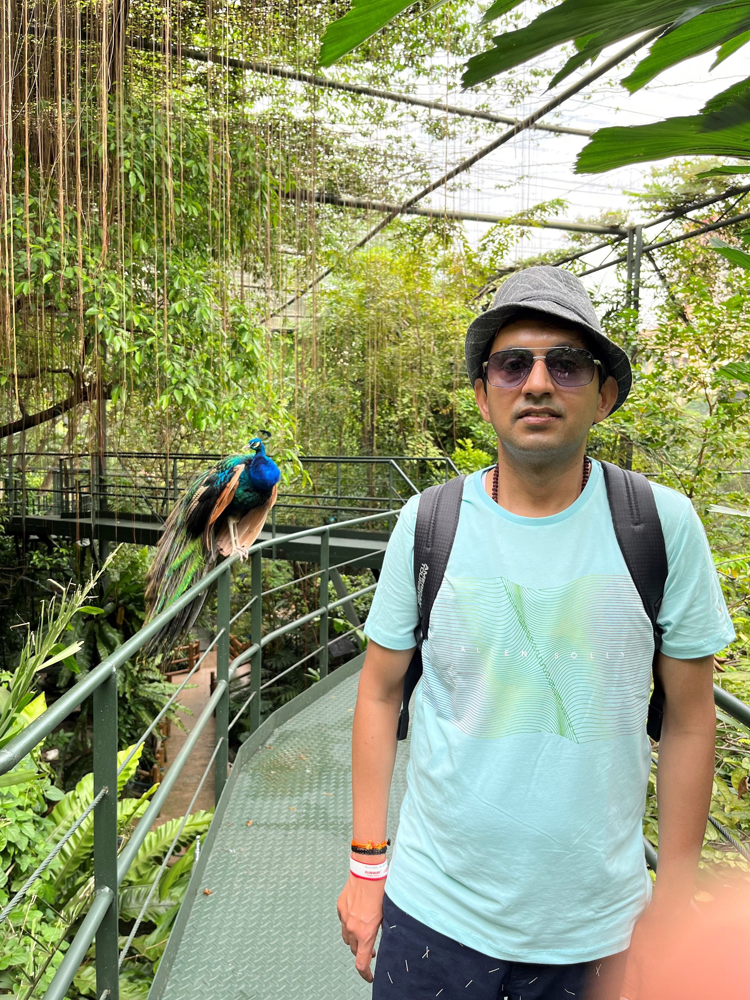

In [41]:
image

- Write the `question` you want to ask to the model about the image.

In [15]:
question1 = "Which bird is in the picture?"

In [16]:
question2 = "What is the color of hat of the boy?"

In [25]:
question3 = "What is the color of tee-shirt of the boy in picture?"

In [35]:
question4 = "What does the background of the picture looks like?"

In [36]:
question5 = "how many birds and humans are there in the picture?"

In [37]:
question=[question1,question2,question3,question4,question5]

In [38]:
for questions in question:
    out = model.generate(**(processor(image, questions, return_tensors="pt")))
    print(questions)
    print(processor.decode(out[0], skip_special_tokens=True))

Which bird is in the picture?
peacock
What is the color of hat of the boy?
gray
What is the color of tee-shirt of the boy in picture?
blue
What does the background of the picture looks like?
trees
how many birds and humans are there in the picture?
2


In [39]:
print('Similarily we can ask any question from the image')

Similarily we can ask any question from the image


##  <font color='green'>Free up memory</font>

In [40]:
import gc
del model
del processor
gc.collect()

877